In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import operator
from networkx.algorithms import community

COLORS = ['magenta', 'darkviolet', 'blue', 'deepskyblue', 'darkcyan', 'lime', 'gold',
          'orange', 'sienna', 'red', 'silver']

In [62]:
#function to search for nodes in a circle
def search_circle(circles_dict, nodeID):
    for key, values in circles_dict.items():
        if nodeID in values:
            return key
    return 'None'

In [2]:
# NodeID 0 (not in here) and its ego network
G0 = nx.Graph()
edges0 = np.genfromtxt("facebook.tar/facebook/0.edges", dtype=str, delimiter=' ')

for edge in edges0:
    G0.add_edge(edge[0], edge[1])
    
#plt.figure(figsize=(75,75))
#nx.draw(G0, node_color='green')

#plt.savefig("node0_ego_network.png", format="PNG")
#plt.show()

In [11]:
#find the 10 nodes with the highest pagerank  
pr = nx.pagerank(G0, alpha=0.85)
sorted_pr = sorted(pr.items(), key=operator.itemgetter(1),reverse=True) #sorts the page ranks of the nodes
print(sorted_pr[:10]) #find the top 10 nodes with highest page rank

[('25', 0.010070487209370054), ('56', 0.009879906366731061), ('322', 0.009792201359134235), ('119', 0.009583851044928452), ('67', 0.009471605723773828), ('271', 0.009032007886581874), ('277', 0.008964285099430223), ('21', 0.008481784944365505), ('26', 0.00837738411573378), ('252', 0.008125714786457393)]


In [8]:
#find the 10 nodes with the highest betweenness centrality  
bc = nx.betweenness_centrality(G0)
sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]

[('277', 0.2658578437822957),
 ('175', 0.24607453466827836),
 ('19', 0.17884287347619862),
 ('23', 0.13022312594992166),
 ('25', 0.08536287301734348),
 ('119', 0.07733372289576826),
 ('339', 0.0654595453746898),
 ('40', 0.05331836870347711),
 ('152', 0.05143231536417574),
 ('230', 0.04789619141263187)]

In [10]:
#find the 10 nodes with the highest betweenness centrality
cc = nx.closeness_centrality(G0) 
sorted(cc.items(), key=lambda x: x[1], reverse=True)[:10]

[('277', 0.4134789156626506),
 ('25', 0.38090178897407817),
 ('322', 0.3763400909025323),
 ('67', 0.3723269856677896),
 ('119', 0.37100823601371247),
 ('56', 0.36926436651423555),
 ('271', 0.3683985649514823),
 ('315', 0.3683985649514823),
 ('21', 0.36539997198094704),
 ('26', 0.3645521762222905)]

In [12]:
#find the 10 nodes with the highest degree centrality
dc = nx.degree_centrality(G0)
sorted(dc.items(), key=lambda x: x[1], reverse=True)[:10]

[('56', 0.23192771084337352),
 ('67', 0.22590361445783133),
 ('271', 0.21686746987951808),
 ('322', 0.213855421686747),
 ('25', 0.20481927710843376),
 ('26', 0.20180722891566266),
 ('252', 0.1927710843373494),
 ('277', 0.1927710843373494),
 ('21', 0.1927710843373494),
 ('122', 0.18674698795180725)]

In [14]:
#find the 10 edges with the highest edge betweenness centrality
ebc = nx.edge_betweenness_centrality(G0)
sorted(ebc.items(), key=lambda x: x[1], reverse=True)[:10]

[(('175', '277'), 0.23629055706919133),
 (('175', '19'), 0.16278094871490673),
 (('339', '152'), 0.056803791743550776),
 (('307', '40'), 0.04412017583647734),
 (('23', '245'), 0.039907377256774845),
 (('307', '230'), 0.03734726173424598),
 (('115', '19'), 0.03719758746824726),
 (('115', '192'), 0.03451644415499837),
 (('23', '116'), 0.03247816374437886),
 (('23', '144'), 0.027999930433493265)]

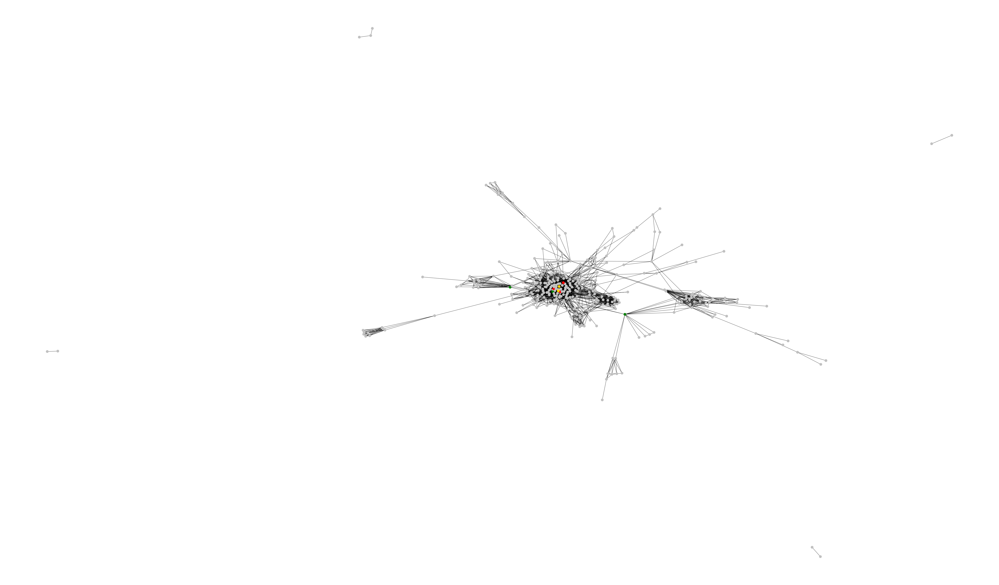

In [32]:
ego_node = '0'
TOP_PR_NODES = ['25', '56', '322']
TOP_BC_NODES = ['277', '175', '19']
TOP_CC_NODES = ['277', '25', '322']
TOP_DC_NODES = ['56', '67', '271']
TOP_EBC_NODES = ['175', '277', '19']

g0 = sorted(G0.nodes, key=str)

ColorLegend = {'top_pr_nodes': 'red','top_bc_nodes': 'green',
               'top_cc_nodes': 'blue', 'top_dc_nodes': 'gold','top_ebc_nodes':'violet','mixed':'orange'}
pos = nx.spring_layout(G0)

color_map = []
for node in G0:
    if node in TOP_PR_NODES:
        color_map.append(ColorLegend['top_pr_nodes']) 
    elif node in TOP_BC_NODES:
        color_map.append(ColorLegend['top_bc_nodes'])
    elif node in TOP_CC_NODES:
        color_map.append(ColorLegend['top_cc_nodes'])
    elif node in TOP_DC_NODES:
        color_map.append(ColorLegend['top_dc_nodes']) 
    elif node in TOP_EBC_NODES:
        color_map.append(ColorLegend['top_ebc_nodes'])    
    else:
        color_map.append(COLORS[-1])
        
plt.figure(figsize=(100,60))
#nx.draw_networkx(G414, pos=pos, node_color=color_map, with_labels=False, node_size=200)
nx.draw_networkx(G0, pos=pos,node_color=color_map, with_labels=False, node_size=200)
plt.axis('off')
plt.savefig("node0_centrality_network.png", format="PNG")
plt.show()


In [25]:
# NodeID 107 (not in here) and its ego network
G107 = nx.Graph()
edges107 = np.genfromtxt("facebook.tar/facebook/107.edges", dtype=str, delimiter=' ')

for edge in edges107:
    G107.add_edge(edge[0], edge[1])
    
#plt.figure(figsize=(75,75))
#nx.draw(G107, node_color='purple')

#plt.savefig("node107_ego_network.png", format="PNG")
#plt.show()

In [16]:
#find the top 10 nodes with highest page rank
pr = nx.pagerank(G107, alpha=0.85)
sorted_pr = sorted(pr.items(), key=operator.itemgetter(1),reverse=True) #sorts the page ranks of the nodes
print(sorted_pr[:10]) 

[('483', 0.0036685024971514772), ('917', 0.0029845935158713506), ('1888', 0.002803702689458632), ('1800', 0.00275440352508514), ('1352', 0.002653508447207948), ('1783', 0.0026458052568811763), ('1663', 0.0026302669298645764), ('1431', 0.0026240631688953875), ('1086', 0.002620061299170669), ('1730', 0.002612626312038004)]


In [21]:
#find the 10 nodes with the highest betweenness centrality 
bc = nx.betweenness_centrality(G107)
sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]

[('1086', 0.10655734717232888),
 ('1584', 0.05025221728853711),
 ('917', 0.048952639437607116),
 ('483', 0.04257293205991593),
 ('1334', 0.018894584956143514),
 ('1371', 0.018669816336763123),
 ('606', 0.018293850383169163),
 ('1703', 0.018099315454348737),
 ('637', 0.017049795086259287),
 ('1536', 0.016416002906163785)]

In [22]:
#find the 10 nodes with the highest closeness centrality 
cc = nx.closeness_centrality(G107) 
sorted(cc.items(), key=lambda x: x[1], reverse=True)[:10]

[('1086', 0.48293595137914913),
 ('1584', 0.4642696629213483),
 ('1800', 0.44468359879466207),
 ('1334', 0.4410760034158839),
 ('483', 0.4397616006811409),
 ('917', 0.4369712351945855),
 ('1746', 0.4364174059991551),
 ('1620', 0.4362331081081081),
 ('1352', 0.43604896580835795),
 ('1730', 0.4343986543313709)]

In [23]:
#find the 10 nodes with the highest degree centrality 
dc = nx.degree_centrality(G107)
sorted(dc.items(), key=lambda x: x[1], reverse=True)[:10]

[('1888', 0.24491771539206197),
 ('1800', 0.2362052274927396),
 ('1663', 0.2265246853823814),
 ('1352', 0.2255566311713456),
 ('1730', 0.21781219748305905),
 ('1431', 0.21200387221684416),
 ('1199', 0.2090997095837367),
 ('1584', 0.20329138431752178),
 ('1768', 0.20135527589545016),
 ('1086', 0.1974830590513069)]

In [24]:
#find the 10 edges with the highest betweenness centrality 
ebc = nx.edge_betweenness_centrality(G107)
sorted(ebc.items(), key=lambda x: x[1], reverse=True)[:10]

[(('1086', '917'), 0.012774881442306927),
 (('1467', '1371'), 0.012319510676129491),
 (('1703', '1584'), 0.012213776207680131),
 (('1091', '1890'), 0.011549242502260977),
 (('1235', '1086'), 0.009469451333159802),
 (('1192', '1086'), 0.008108750975284401),
 (('1298', '1086'), 0.00661343334128932),
 (('1469', '1866'), 0.006602516585780104),
 (('927', '1611'), 0.006570325402608949),
 (('483', '1086'), 0.0060050488724350485)]

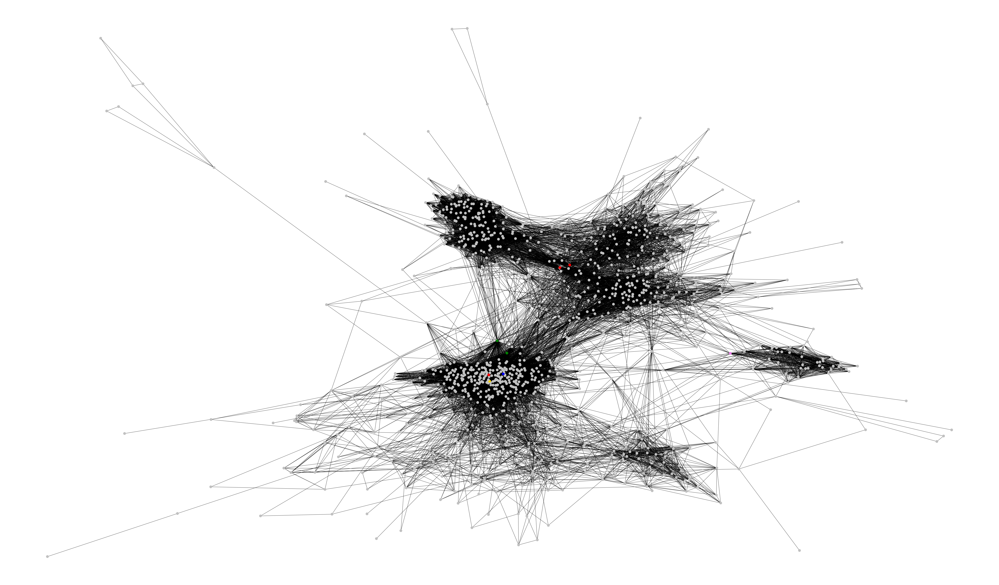

In [26]:
ego_node = '107'
TOP_PR_NODES = ['483', '917', '1888']
TOP_BC_NODES = ['1584', '1086', '917']
TOP_CC_NODES = ['1086', '1584', '1800']
TOP_DC_NODES = ['1888', '1800', '1663']
TOP_EBC_NODES = ['1086', '917', '1371']

g107 = sorted(G107.nodes, key=str)

ColorLegend = {'top_pr_nodes': 'red','top_bc_nodes': 'green',
               'top_cc_nodes': 'blue', 'top_dc_nodes': 'gold','top_ebc_nodes':'violet','mixed':'orange'}
pos = nx.spring_layout(G107)

color_map = []
for node in G107:
    if node in TOP_PR_NODES:
        color_map.append(ColorLegend['top_pr_nodes']) 
    elif node in TOP_BC_NODES:
        color_map.append(ColorLegend['top_bc_nodes'])
    elif node in TOP_CC_NODES:
        color_map.append(ColorLegend['top_cc_nodes'])
    elif node in TOP_DC_NODES:
        color_map.append(ColorLegend['top_dc_nodes']) 
    elif node in TOP_EBC_NODES:
        color_map.append(ColorLegend['top_ebc_nodes'])    
    else:
        color_map.append(COLORS[-1])
        
plt.figure(figsize=(100,60))
nx.draw_networkx(G107, pos=pos,node_color=color_map, with_labels=False, node_size=200)
plt.axis('off')
plt.savefig("node107_centrality_network.png", format="PNG")
plt.show()


In [27]:
# NodeID 348 (not in here) and its ego network
G348 = nx.Graph()
edges348 = np.genfromtxt("facebook.tar/facebook/348.edges", dtype=str, delimiter=' ')

for edge in edges348:
    G348.add_edge(edge[0], edge[1])
    
#plt.figure(figsize=(75,75))
#nx.draw(G348, node_color='orange')

#plt.savefig("node348_ego_network.png", format="PNG")
#plt.show()

In [29]:
#find the top 10 nodes with highest page rank
pr = nx.pagerank(G348, alpha=0.85)
sorted_pr = sorted(pr.items(), key=operator.itemgetter(1),reverse=True) 
print(sorted_pr[:10]) 

[('376', 0.012459526742156677), ('475', 0.011255046718360143), ('412', 0.011190493517471077), ('563', 0.011109563695356374), ('373', 0.010326801315389449), ('497', 0.010159042959780462), ('428', 0.009351387395432512), ('553', 0.009147191128708885), ('500', 0.009110168978509484), ('513', 0.008969050619321484)]


In [30]:
#find the 10 nodes with the highest betweenness centrality 
bc = nx.betweenness_centrality(G348)
sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]

[('563', 0.10120795316924848),
 ('549', 0.0868715632418795),
 ('198', 0.07791051782083173),
 ('412', 0.06467541819712938),
 ('373', 0.05427792749287458),
 ('419', 0.04549611793483509),
 ('428', 0.04477554108502642),
 ('376', 0.04149676806376732),
 ('463', 0.04121565643042665),
 ('437', 0.03739027692486627)]

In [31]:
#find the 10 nodes with the highest closeness centrality 
cc = nx.closeness_centrality(G348) 
sorted(cc.items(), key=lambda x: x[1], reverse=True)[:10]

[('376', 0.5717948717948718),
 ('475', 0.5506172839506173),
 ('412', 0.5425790754257908),
 ('563', 0.5425790754257908),
 ('428', 0.5412621359223301),
 ('373', 0.538647342995169),
 ('497', 0.5347721822541966),
 ('513', 0.5271867612293144),
 ('561', 0.5259433962264151),
 ('525', 0.522248243559719)]

In [32]:
#find the 10 nodes with the highest degree centrality 
dc = nx.degree_centrality(G348)
sorted(dc.items(), key=lambda x: x[1], reverse=True)[:10]

[('376', 0.4439461883408072),
 ('475', 0.3991031390134529),
 ('412', 0.39461883408071746),
 ('497', 0.36771300448430494),
 ('373', 0.34977578475336324),
 ('553', 0.33183856502242154),
 ('500', 0.3273542600896861),
 ('561', 0.3273542600896861),
 ('513', 0.3273542600896861),
 ('428', 0.32286995515695066)]

In [33]:
#find the 10 edges with the highest betweenness centrality 
ebc = nx.edge_betweenness_centrality(G348)
sorted(ebc.items(), key=lambda x: x[1], reverse=True)[:10]

[(('549', '198'), 0.08568225496476617),
 (('373', '498'), 0.03804245082245329),
 (('463', '437'), 0.03532377704484764),
 (('412', '549'), 0.034784192196617325),
 (('549', '563'), 0.030900889260499793),
 (('428', '549'), 0.02619425147730783),
 (('462', '532'), 0.02541894528587269),
 (('387', '383'), 0.01777706598334401),
 (('532', '386'), 0.01777706598334401),
 (('453', '498'), 0.016123261475182726)]

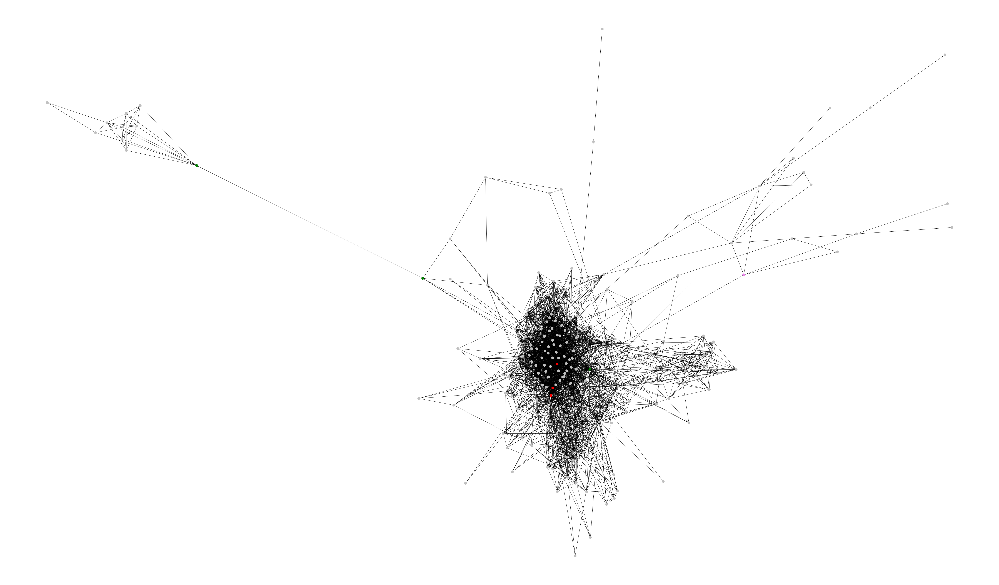

In [28]:
ego_node = '348'
TOP_PR_NODES = ['376', '475', '412']
TOP_BC_NODES = ['563', '549', '198']
TOP_CC_NODES = ['376', '475', '412']
TOP_DC_NODES = ['1888', '1800', '1663']
TOP_EBC_NODES = ['549', '498', '563']

g348 = sorted(G348.nodes, key=str)

ColorLegend = {'top_pr_nodes': 'red','top_bc_nodes': 'green',
               'top_cc_nodes': 'blue', 'top_dc_nodes': 'gold','top_ebc_nodes':'violet','mixed':'orange'}
pos = nx.spring_layout(G348)

# f = plt.figure(1)
# ax = f.add_subplot(1,1,1)
# for label in ColorLegend:
#     ax.plot([0],[0], color=ColorLegend[label], label=label)

color_map = []
for node in G348:
    if node in TOP_PR_NODES:
        color_map.append(ColorLegend['top_pr_nodes']) 
    elif node in TOP_BC_NODES:
        color_map.append(ColorLegend['top_bc_nodes'])
    elif node in TOP_CC_NODES:
        color_map.append(ColorLegend['top_cc_nodes'])
    elif node in TOP_DC_NODES:
        color_map.append(ColorLegend['top_dc_nodes']) 
    elif node in TOP_EBC_NODES:
        color_map.append(ColorLegend['top_ebc_nodes'])    
    else:
        color_map.append(COLORS[-1])
        
plt.figure(figsize=(100,60))
nx.draw_networkx(G348, pos=pos,node_color=color_map, with_labels=False, node_size=200)
plt.axis('off')
plt.savefig("node348_centrality_network.png", format="PNG")
plt.show()


In [29]:
# NodeID 414 (not in here) and its ego network
G414 = nx.Graph()
edges414 = np.genfromtxt("facebook.tar/facebook/414.edges", dtype=str, delimiter=' ')

for edge in edges414:
    G414.add_edge(edge[0], edge[1])
    
#plt.figure(figsize=(75,75))
#nx.draw(G414, node_color='teal')

#plt.savefig("node414_ego_network.png", format="PNG")
#plt.show()

In [36]:
#find the 10 nodes with highest page rank
pr = nx.pagerank(G414, alpha=0.85)
sorted_pr = sorted(pr.items(), key=operator.itemgetter(1),reverse=True) #sorts the page ranks of the nodes
print(sorted_pr[:10]) #find the top two nodes with highest page rank

[('376', 0.013987835634032624), ('592', 0.013172040091224186), ('428', 0.012848277636881582), ('630', 0.012716458649574124), ('579', 0.012455033898831396), ('373', 0.012388382411201604), ('348', 0.011950979251640757), ('513', 0.011521285674909095), ('483', 0.011368561849909375), ('436', 0.010836116807380456)]


In [37]:
#find the 10 nodes with the highest betweenness centrality
bc = nx.betweenness_centrality(G414)
sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]

[('436', 0.22611810157808224),
 ('635', 0.20531295235409025),
 ('422', 0.08731611190556607),
 ('634', 0.061323131168385336),
 ('553', 0.05636009759829645),
 ('647', 0.05139281672090499),
 ('395', 0.05103447146641494),
 ('428', 0.04926511127455314),
 ('373', 0.04429326417416478),
 ('609', 0.04410492525048102)]

In [38]:
#find the 10 nodes with the highest closeness centrality
cc = nx.closeness_centrality(G414) #prints five nodes with the highest closeness centrality
sorted(cc.items(), key=lambda x: x[1], reverse=True)[:10]

[('373', 0.5142795944595174),
 ('553', 0.5053200196431494),
 ('436', 0.5000925711640825),
 ('395', 0.4983740399916972),
 ('483', 0.49497216941154915),
 ('412', 0.49328859060402686),
 ('376', 0.48830587756762256),
 ('428', 0.4866672672402144),
 ('348', 0.485039617517003),
 ('438', 0.485039617517003)]

In [39]:
#find the 10 nodes with the highest degree centrality
dc = nx.degree_centrality(G414)
sorted(dc.items(), key=lambda x: x[1], reverse=True)[:10]

[('376', 0.3825503355704698),
 ('373', 0.35570469798657717),
 ('513', 0.32885906040268453),
 ('428', 0.3221476510067114),
 ('483', 0.31543624161073824),
 ('348', 0.30201342281879195),
 ('591', 0.30201342281879195),
 ('559', 0.30201342281879195),
 ('436', 0.2953020134228188),
 ('475', 0.2953020134228188)]

In [40]:
#find the 10 edges with the highest betweenness centrality
ebc = nx.edge_betweenness_centrality(G414)
sorted(ebc.items(), key=lambda x: x[1], reverse=True)[:10]

[(('436', '635'), 0.21355892576966393),
 (('647', '634'), 0.06160885946523539),
 (('373', '680'), 0.030778233020368192),
 (('436', '395'), 0.021810165805088853),
 (('428', '609'), 0.02138957641762499),
 (('683', '654'), 0.020912275778529693),
 (('436', '637'), 0.019261634786229432),
 (('553', '634'), 0.01822262388746761),
 (('630', '395'), 0.01768112780643165),
 (('553', '644'), 0.017475404367622835)]

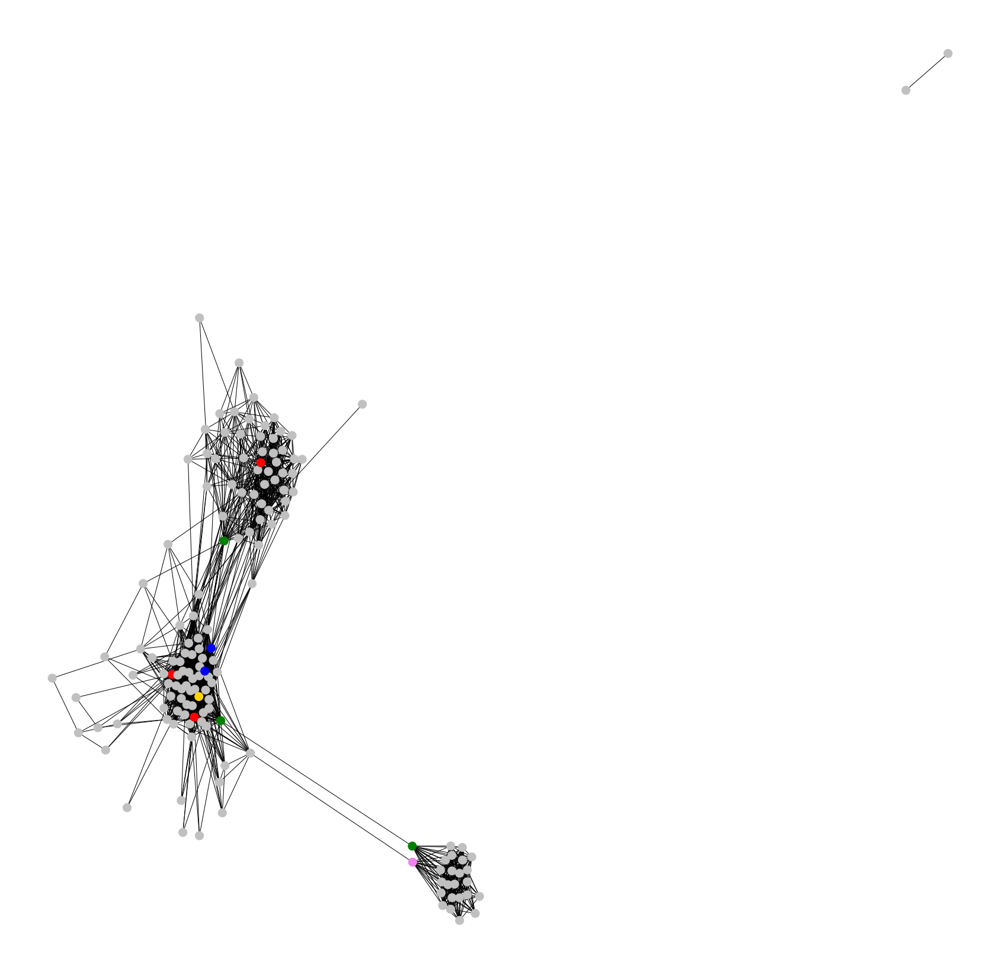

In [30]:
ego_node = '414'
TOP_PR_NODES = ['376', '592', '428']
TOP_BC_NODES = ['436', '635', '422']
TOP_CC_NODES = ['373', '553', '436']
TOP_DC_NODES = ['376', '373', '513']
TOP_EBC_NODES = ['436', '647', '373']

g414 = sorted(G414.nodes, key=str)

ColorLegend = {'top_pr_nodes': 'red','top_bc_nodes': 'green',
               'top_cc_nodes': 'blue', 'top_dc_nodes': 'gold','top_ebc_nodes':'violet','mixed':'orange'}
pos = nx.spring_layout(G414)

# f = plt.figure(1)
# ax = f.add_subplot(1,1,1)
# for label in ColorLegend:
#     ax.plot([0],[0], color=ColorLegend[label], label=label)

color_map = []
for node in G414:
    if node in TOP_PR_NODES:
        color_map.append(ColorLegend['top_pr_nodes']) 
    elif node in TOP_BC_NODES:
        color_map.append(ColorLegend['top_bc_nodes'])
    elif node in TOP_CC_NODES:
        color_map.append(ColorLegend['top_cc_nodes'])
    elif node in TOP_DC_NODES:
        color_map.append(ColorLegend['top_dc_nodes']) 
    elif node in TOP_EBC_NODES:
        color_map.append(ColorLegend['top_ebc_nodes'])    
    else:
        color_map.append(COLORS[-1])
        
plt.figure(figsize=(30,30))
nx.draw_networkx(G414, pos=pos,node_color=color_map, with_labels=False, node_size=200)
plt.axis('off')
plt.savefig("node414_centrality_network.png", format="PNG")
plt.show()


In [56]:
kc = nx.eigenvector_centrality(G414,max_iter=5000)
sorted(kc.items(), key=lambda x: x[1], reverse=True)[:10]

[('376', 0.19335976296693905),
 ('373', 0.18919569568772795),
 ('513', 0.1793022595468077),
 ('559', 0.17605722949738706),
 ('492', 0.16778991705674987),
 ('475', 0.16650379348336752),
 ('483', 0.16629291389736484),
 ('378', 0.1662730852498229),
 ('591', 0.16538603212475492),
 ('428', 0.16256014099420524)]

In [ ]:
G414.nodes['577']

In [11]:
# NodeID 686 (not in here) and its ego network
G686 = nx.Graph()
edges686 = np.genfromtxt("facebook.tar/facebook/686.edges", dtype=str, delimiter=' ')

for edge in edges686:
    G686.add_edge(edge[0], edge[1])
    
#plt.figure(figsize=(75,75))
#nx.draw(G686, node_color='brown')

#plt.savefig("node686_ego_network.png", format="PNG")
#plt.show()

In [44]:
#find the 10 nodes with highest page rank
pr = nx.pagerank(G686, alpha=0.85)
sorted_pr = sorted(pr.items(), key=operator.itemgetter(1),reverse=True) 
print(sorted_pr[:10]) 

[('828', 0.019026564028916018), ('713', 0.01879927871667069), ('705', 0.016721273871313794), ('719', 0.015552113726713898), ('805', 0.015153657614800269), ('745', 0.014150618400664115), ('747', 0.013980121354966561), ('824', 0.013811639298746507), ('694', 0.013384446315002544), ('823', 0.01307804118090783)]


In [45]:
#find the 10 nodes with highest betweenness centrality
bc = nx.betweenness_centrality(G686)
sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]

[('713', 0.13741194434486204),
 ('828', 0.05924555520517978),
 ('818', 0.051453896571783286),
 ('719', 0.05047875627653779),
 ('705', 0.049064324504153475),
 ('805', 0.04805016871196235),
 ('694', 0.045208000057221066),
 ('739', 0.04130632251740466),
 ('688', 0.04124393022340474),
 ('829', 0.03987366208665207)]

In [46]:
#find the 10 nodes with highest closeness centrality
cc = nx.closeness_centrality(G686) 
sorted(cc.items(), key=lambda x: x[1], reverse=True)[:10]

[('713', 0.6007194244604317),
 ('828', 0.594306049822064),
 ('719', 0.5699658703071673),
 ('805', 0.5680272108843537),
 ('705', 0.5641891891891891),
 ('697', 0.5475409836065573),
 ('824', 0.5475409836065573),
 ('747', 0.5422077922077922),
 ('688', 0.540453074433657),
 ('745', 0.540453074433657)]

In [47]:
#find the 10 nodes with highest degree centrality
dc = nx.degree_centrality(G686)
sorted(dc.items(), key=lambda x: x[1], reverse=True)[:10]

[('828', 0.46107784431137727),
 ('713', 0.4191616766467066),
 ('705', 0.407185628742515),
 ('719', 0.37724550898203596),
 ('805', 0.37125748502994016),
 ('824', 0.3413173652694611),
 ('745', 0.3353293413173653),
 ('747', 0.3293413173652695),
 ('823', 0.32335329341317365),
 ('694', 0.31736526946107785)]

In [48]:
#find the 10 edges with the highest betweenness centrality
ebc = nx.edge_betweenness_centrality(G686)
sorted(ebc.items(), key=lambda x: x[1], reverse=True)[:10]

[(('739', '757'), 0.035286569717707446),
 (('694', '798'), 0.03097324615676713),
 (('713', '833'), 0.025374113534588617),
 (('688', '771'), 0.02385327865537634),
 (('805', '818'), 0.022148647795185904),
 (('719', '768'), 0.020440325032194125),
 (('713', '818'), 0.01901872782128428),
 (('697', '818'), 0.01791800626597691),
 (('829', '822'), 0.016744187825602823),
 (('766', '771'), 0.013716527314003727)]

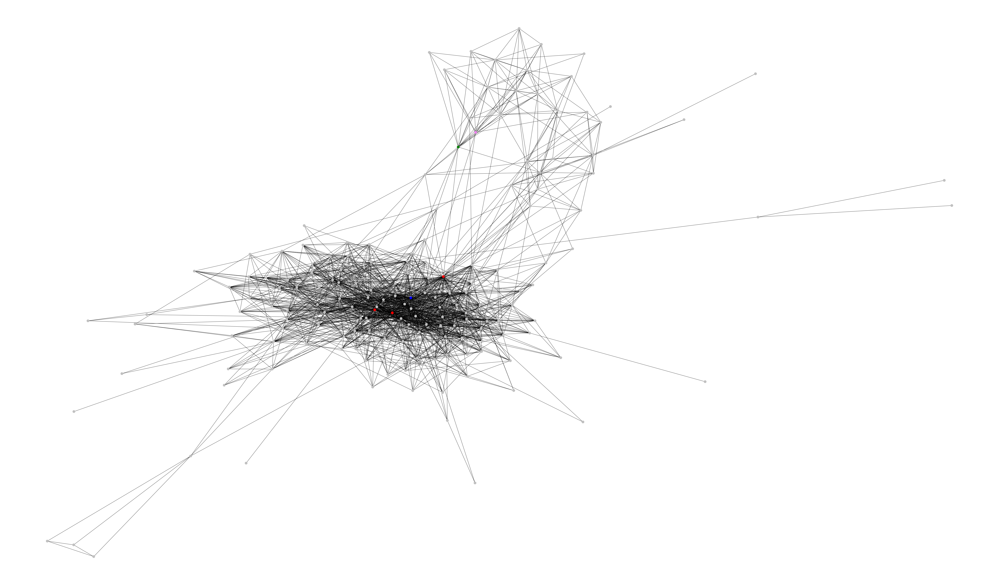

In [33]:
ego_node = '686'
TOP_PR_NODES = ['828', '713', '705']
TOP_BC_NODES = ['713', '828', '818']
TOP_CC_NODES = ['713', '828', '719']
TOP_DC_NODES = ['828', '713', '705']
TOP_EBC_NODES = ['713', '818', '771']

g686 = sorted(G686.nodes, key=str)

ColorLegend = {'top_pr_nodes': 'red','top_bc_nodes': 'green',
               'top_cc_nodes': 'blue', 'top_dc_nodes': 'gold','top_ebc_nodes':'violet','mixed':'orange'}
pos = nx.spring_layout(G686)



color_map = []
for node in G686:
    if node in TOP_PR_NODES:
        color_map.append(ColorLegend['top_pr_nodes']) 
    elif node in TOP_BC_NODES:
        color_map.append(ColorLegend['top_bc_nodes'])
    elif node in TOP_CC_NODES:
        color_map.append(ColorLegend['top_cc_nodes'])
    elif node in TOP_DC_NODES:
        color_map.append(ColorLegend['top_dc_nodes']) 
    elif node in TOP_EBC_NODES:
        color_map.append(ColorLegend['top_ebc_nodes'])    
    else:
        color_map.append(COLORS[-1])
        
plt.figure(figsize=(100,60))
nx.draw_networkx(G686, pos=pos,node_color=color_map, with_labels=False, node_size=200)
plt.axis('off')
plt.savefig("node686_centrality_network.png", format="PNG")
plt.show()

In [34]:
# NodeID 698 (not in here) and its ego network
G698 = nx.Graph()
edges698 = np.genfromtxt("facebook.tar/facebook/698.edges", dtype=str, delimiter=' ')

for edge in edges698:
    G698.add_edge(edge[0], edge[1])
    
#plt.figure(figsize=(75,75))
#nx.draw(G698, node_color='pink')

#plt.savefig("node698_ego_network.png", format="PNG")
#plt.show()

In [50]:
#find the 10 nodes with the highest pagerank
pr = nx.pagerank(G698, alpha=0.85)
sorted_pr = sorted(pr.items(), key=operator.itemgetter(1),reverse=True)
print(sorted_pr[:10]) 

[('856', 0.04228489417679164), ('747', 0.02764925624848781), ('885', 0.02490634519379937), ('828', 0.024594824845660036), ('823', 0.023239355408149122), ('708', 0.022817738178866263), ('774', 0.022433605233561214), ('697', 0.02240926603413628), ('800', 0.02110058596914849), ('871', 0.02086201640868625)]


In [51]:
#find the 10 nodes with the highest betweenness centrality
bc = nx.betweenness_centrality(G698)
sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]

[('856', 0.18969218915754316),
 ('747', 0.03739503068437317),
 ('769', 0.025034127748222307),
 ('871', 0.016148775894538607),
 ('753', 0.01450704782459518),
 ('857', 0.013559322033898306),
 ('697', 0.012114064097324838),
 ('804', 0.01192943730554582),
 ('828', 0.011183571432561303),
 ('708', 0.010797303515858376)]

In [52]:
#find the 10 nodes with the highest closeness centrality
cc = nx.closeness_centrality(G698) 
sorted(cc.items(), key=lambda x: x[1], reverse=True)[:10]

[('856', 0.5173469387755102),
 ('747', 0.4370689655172414),
 ('828', 0.41557377049180333),
 ('697', 0.4023809523809524),
 ('708', 0.4023809523809524),
 ('823', 0.4023809523809524),
 ('774', 0.4023809523809524),
 ('800', 0.39609375),
 ('819', 0.38409090909090915),
 ('830', 0.37835820895522393)]

In [53]:
#find the 10 nodes with the highest degree centrality
dc = nx.degree_centrality(G698)
sorted(dc.items(), key=lambda x: x[1], reverse=True)[:10]

[('856', 0.48333333333333334),
 ('747', 0.35),
 ('828', 0.31666666666666665),
 ('823', 0.3),
 ('697', 0.2833333333333333),
 ('708', 0.2833333333333333),
 ('774', 0.2833333333333333),
 ('719', 0.26666666666666666),
 ('805', 0.26666666666666666),
 ('800', 0.26666666666666666)]

In [54]:
#find the 10 edges with the highest betweenness centrality
ebc = nx.edge_betweenness_centrality(G698)
sorted(ebc.items(), key=lambda x: x[1], reverse=True)[:10]

[(('856', '893'), 0.025627935960118874),
 (('864', '856'), 0.025104256542996826),
 (('856', '825'), 0.021997959379322612),
 (('769', '798'), 0.021311475409836064),
 (('857', '871'), 0.017486338797814208),
 (('747', '804'), 0.0174857851446442),
 (('856', '882'), 0.016277280703510213),
 (('856', '769'), 0.016200729973378805),
 (('856', '878'), 0.016004056659794364),
 (('856', '863'), 0.015925992647304127)]

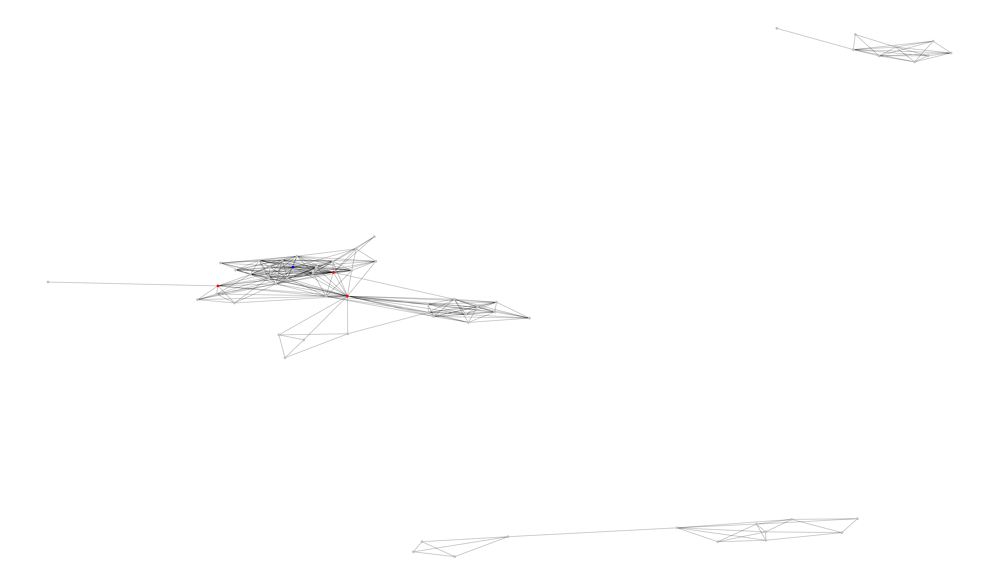

In [35]:
ego_node = '698'
TOP_PR_NODES = ['856', '747', '769']
TOP_BC_NODES = ['856', '747', '769']
TOP_CC_NODES = ['856', '747', '828']
TOP_DC_NODES = ['856', '747', '828']
TOP_EBC_NODES = ['856', '769', '747']

g698 = sorted(G698.nodes, key=str)

ColorLegend = {'top_pr_nodes': 'red','top_bc_nodes': 'green',
               'top_cc_nodes': 'blue', 'top_dc_nodes': 'gold','top_ebc_nodes':'violet','mixed':'orange'}
pos = nx.spring_layout(G698)


color_map = []
for node in G698:
    if node in TOP_PR_NODES:
        color_map.append(ColorLegend['top_pr_nodes']) 
    elif node in TOP_BC_NODES:
        color_map.append(ColorLegend['top_bc_nodes'])
    elif node in TOP_CC_NODES:
        color_map.append(ColorLegend['top_cc_nodes'])
    elif node in TOP_DC_NODES:
        color_map.append(ColorLegend['top_dc_nodes']) 
    elif node in TOP_EBC_NODES:
        color_map.append(ColorLegend['top_ebc_nodes'])    
    else:
        color_map.append(COLORS[-1])
        
plt.figure(figsize=(100,60))
nx.draw_networkx(G698, pos=pos,node_color=color_map, with_labels=False, node_size=200)
plt.axis('off')
plt.savefig("node698_centrality_network.png", format="PNG")
plt.show()

In [36]:
# NodeID 1684 (not in here) and its ego network
G1684 = nx.Graph()
edges1684 = np.genfromtxt("facebook.tar/facebook/1684.edges", dtype=str, delimiter=' ')

for edge in edges1684:
    G1684.add_edge(edge[0], edge[1])
    
#plt.figure(figsize=(75,75))
#nx.draw(G1684, node_color='yellow')

#plt.savefig("node1684_ego_network.png", format="PNG")
#plt.show()

In [61]:
#find the 10 nodes with the highest pagerank
pr = nx.pagerank(G1684, alpha=0.85)
sorted_pr = sorted(pr.items(), key=operator.itemgetter(1),reverse=True) #sorts the page ranks of the nodes
print(sorted_pr[:10]) #find the top two nodes with highest page rank

[('2951', 0.0036402329816868813), ('3101', 0.003577325604800145), ('3291', 0.0035327605666263043), ('2863', 0.0034936186058635377), ('3397', 0.0034336680916058006), ('2730', 0.00339459851062302), ('3320', 0.003320758778737131), ('3082', 0.0032962145582518055), ('2742', 0.003285841925453107), ('3280', 0.0032171404659678453)]


In [62]:
#find the 10 nodes with the highest betweenness centrality
bc = nx.betweenness_centrality(G1684)
sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]

[('2754', 0.0806548115185837),
 ('2863', 0.06820661907025216),
 ('2946', 0.06552443161637876),
 ('3117', 0.06158058743248248),
 ('3105', 0.041117274898007344),
 ('2738', 0.03045383460143375),
 ('3168', 0.028972837557033657),
 ('3263', 0.02740157012725196),
 ('3274', 0.026676067056609677),
 ('2729', 0.02609352540376182)]

In [63]:
#find the 10 nodes with the highest closeness centrality
cc = nx.closeness_centrality(G1684) 
sorted(cc.items(), key=lambda x: x[1], reverse=True)[:10]

[('2863', 0.44369426751592356),
 ('3274', 0.42705883610933887),
 ('3117', 0.42397452229299365),
 ('2946', 0.42163212161734176),
 ('3302', 0.4200077821284472),
 ('3101', 0.4183959101575595),
 ('2787', 0.415887814783318),
 ('3214', 0.4131857824187269),
 ('3342', 0.4129621970386302),
 ('3291', 0.4100774530507193)]

In [64]:
#find the 10 nodes with the highest degree centrality
dc = nx.degree_centrality(G1684)
sorted(dc.items(), key=lambda x: x[1], reverse=True)[:10]

[('2839', 0.1732484076433121),
 ('3363', 0.16560509554140126),
 ('2754', 0.15414012738853503),
 ('3101', 0.15414012738853503),
 ('3291', 0.1503184713375796),
 ('3082', 0.1464968152866242),
 ('2742', 0.1464968152866242),
 ('3397', 0.14522292993630573),
 ('3426', 0.14267515923566879),
 ('3320', 0.14267515923566879)]

In [65]:
#find the 10 edges with the highest betweenness centrality
ebc = nx.edge_betweenness_centrality(G1684)
sorted(ebc.items(), key=lambda x: x[1], reverse=True)[:10]

[(('2754', '2863'), 0.04264551677206017),
 (('2754', '3105'), 0.04152582779246976),
 (('2738', '3168'), 0.027460410044006484),
 (('3251', '3105'), 0.01988946694543038),
 (('2669', '3274'), 0.017511649939078812),
 (('3005', '3010'), 0.015737163905570853),
 (('2694', '2863'), 0.015374428657260896),
 (('2806', '3309'), 0.014931914742149754),
 (('2946', '3263'), 0.014797362738007224),
 (('2754', '2812'), 0.013773210207434971)]

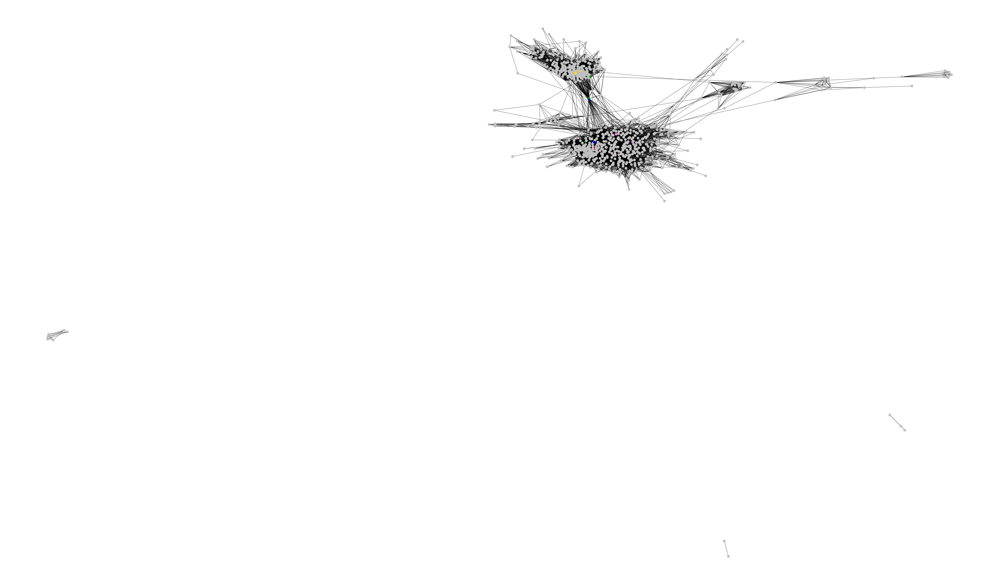

In [37]:
ego_node = '1684'
TOP_PR_NODES = ['2951', '3101', '3291']
TOP_BC_NODES = ['2754', '2863', '2946']
TOP_CC_NODES = ['2863', '3274', '3117']
TOP_DC_NODES = ['2839', '3363', '2754']
TOP_EBC_NODES = ['2754', '2812', '3263']

g1684 = sorted(G1684.nodes, key=str)

ColorLegend = {'top_pr_nodes': 'red','top_bc_nodes': 'green',
               'top_cc_nodes': 'blue', 'top_dc_nodes': 'gold','top_ebc_nodes':'violet','mixed':'orange'}
pos = nx.spring_layout(G1684)

color_map = []
for node in G1684:
    if node in TOP_PR_NODES:
        color_map.append(ColorLegend['top_pr_nodes']) 
    elif node in TOP_BC_NODES:
        color_map.append(ColorLegend['top_bc_nodes'])
    elif node in TOP_CC_NODES:
        color_map.append(ColorLegend['top_cc_nodes'])
    elif node in TOP_DC_NODES:
        color_map.append(ColorLegend['top_dc_nodes']) 
    elif node in TOP_EBC_NODES:
        color_map.append(ColorLegend['top_ebc_nodes'])    
    else:
        color_map.append(COLORS[-1])
        
plt.figure(figsize=(100,60))
nx.draw_networkx(G1684, pos=pos,node_color=color_map, with_labels=False, node_size=200)
plt.axis('off')
plt.savefig("node1684_centrality_network.png", format="PNG")
plt.show()

In [38]:
# NodeID 1912 (not in here) and its ego network
G1912 = nx.Graph()
edges1912 = np.genfromtxt("facebook.tar/facebook/1912.edges", dtype=str, delimiter=' ')

for edge in edges1912:
    G1912.add_edge(edge[0], edge[1])
    
#plt.figure(figsize=(75,75))
#nx.draw(G1912, node_color='purple')

#plt.savefig("node1912_ego_network.png", format="PNG")
#plt.show()

In [66]:
#find the 10 nodes with the highest pagerank
pr = nx.pagerank(G1912, alpha=0.85)
sorted_pr = sorted(pr.items(), key=operator.itemgetter(1),reverse=True) 
print(sorted_pr[:10]) #

[('2313', 0.004939311746100152), ('2047', 0.004771451609594724), ('2543', 0.0035811087055055), ('2347', 0.003341048190532582), ('2133', 0.0031976106324691253), ('1964', 0.0031763604331451036), ('2289', 0.0031202002089399006), ('2384', 0.003107743865866514), ('2111', 0.002990576975646907), ('2199', 0.0029599801077421703)]


In [67]:
#find the 10 nodes with the highest betweenness centrality
bc = nx.betweenness_centrality(G1912)
sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]

[('2313', 0.09030450891104706),
 ('2047', 0.08606897492750398),
 ('2543', 0.07955972621424112),
 ('2347', 0.06383215312809332),
 ('1941', 0.0355584801248368),
 ('2126', 0.02906341111421677),
 ('2233', 0.028923933749571227),
 ('1964', 0.028350446050706166),
 ('2116', 0.025244995325947636),
 ('136', 0.024594656853303306)]

In [68]:
#find the 10 nodes with the highest clossness centrality
cc = nx.closeness_centrality(G1912) 
sorted(cc.items(), key=lambda x: x[1], reverse=True)[:10]

[('2543', 0.5489703741418127),
 ('2047', 0.5409444914789208),
 ('2347', 0.5381905922495736),
 ('2199', 0.5211352565796926),
 ('2384', 0.5182157313327476),
 ('2283', 0.5131845106401967),
 ('1941', 0.5114112400436513),
 ('2133', 0.5103531478228713),
 ('2289', 0.5079012109424595),
 ('1926', 0.5047831271099341)]

In [69]:
#find the 10 nodes with the highest degree centrality
dc = nx.degree_centrality(G1912)
sorted(dc.items(), key=lambda x: x[1], reverse=True)[:10]

[('2543', 0.39276139410187666),
 ('2347', 0.38873994638069703),
 ('2266', 0.31233243967828417),
 ('1985', 0.2989276139410188),
 ('1941', 0.29758713136729226),
 ('2233', 0.2962466487935657),
 ('2142', 0.29490616621983917),
 ('2206', 0.2801608579088472),
 ('2611', 0.2761394101876676),
 ('2410', 0.2761394101876676)]

In [70]:
#find the 10 edges with the highest betweenness centrality
ebc = nx.edge_betweenness_centrality(G1912)
sorted(ebc.items(), key=lambda x: x[1], reverse=True)[:10]

[(('2376', '2313'), 0.024387700914675788),
 (('2233', '2116'), 0.01909536532144929),
 (('2433', '2313'), 0.01833105656625018),
 (('2128', '1961'), 0.009173799919171166),
 (('2047', '1985'), 0.0087284894416608),
 (('2126', '2535'), 0.008382357498298854),
 (('2347', '1954'), 0.008087607176202152),
 (('2443', '2527'), 0.007978293872541103),
 (('2347', '2047'), 0.006954889367564512),
 (('2313', '2443'), 0.006794573123156004)]

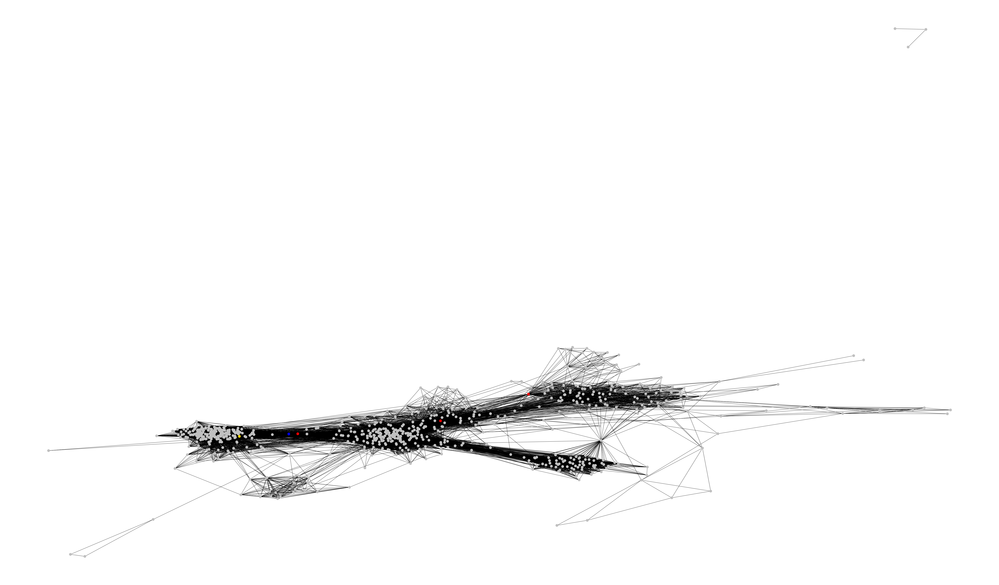

In [39]:
ego_node = '1912'
TOP_PR_NODES = ['2313', '2047', '2543']
TOP_BC_NODES = ['2313', '2047', '2543']
TOP_CC_NODES = ['2543', '2047', '2347']
TOP_DC_NODES = ['2543', '2347', '2266']
TOP_EBC_NODES = ['2313', '2047', '2347']

g1912 = sorted(G1912.nodes, key=str)

ColorLegend = {'top_pr_nodes': 'red','top_bc_nodes': 'green',
               'top_cc_nodes': 'blue', 'top_dc_nodes': 'gold','top_ebc_nodes':'violet','mixed':'orange'}
pos = nx.spring_layout(G1912)


color_map = []
for node in G1912:
    if node in TOP_PR_NODES:
        color_map.append(ColorLegend['top_pr_nodes']) 
    elif node in TOP_BC_NODES:
        color_map.append(ColorLegend['top_bc_nodes'])
    elif node in TOP_CC_NODES:
        color_map.append(ColorLegend['top_cc_nodes'])
    elif node in TOP_DC_NODES:
        color_map.append(ColorLegend['top_dc_nodes']) 
    elif node in TOP_EBC_NODES:
        color_map.append(ColorLegend['top_ebc_nodes'])    
    else:
        color_map.append(COLORS[-1])
        
plt.figure(figsize=(100,60))
nx.draw_networkx(G1912, pos=pos,node_color=color_map, with_labels=False, node_size=200)
plt.axis('off')
plt.savefig("node1912_centrality_network.png", format="PNG")
plt.show()

In [40]:
# NodeID 3437 (not in here) and its ego network
G3437 = nx.Graph()
edges3437 = np.genfromtxt("facebook.tar/facebook/3437.edges", dtype=str, delimiter=' ')

for edge in edges3437:
    G3437.add_edge(edge[0], edge[1])
    
#plt.figure(figsize=(75,75))
#nx.draw(G3437, node_color='red')

#plt.savefig("node3437_ego_network.png", format="PNG")
#plt.show()

In [71]:
#find the 10 nodes with the highest pagerank
pr = nx.pagerank(G3437, alpha=0.85)
sorted_pr = sorted(pr.items(), key=operator.itemgetter(1),reverse=True) #sorts the page ranks of the nodes
print(sorted_pr[:10]) #find the top two nodes with highest page rank

[('3830', 0.00997166960397317), ('3596', 0.005956811131038991), ('3938', 0.00562924784397179), ('3545', 0.005621319334013782), ('3604', 0.00546585273359616), ('3521', 0.005326389263985884), ('3918', 0.0053059146041834915), ('3684', 0.0049240281092407965), ('3756', 0.0046530540644178515), ('3633', 0.004645159892660927)]


In [72]:
#find the 10 nodes with the highest betweenness centrality
bc = nx.betweenness_centrality(G3437)
sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]

[('3830', 0.21339875956116247),
 ('3604', 0.125229855914209),
 ('3918', 0.07812275164043826),
 ('3521', 0.07207682699210965),
 ('3628', 0.0649172976441083),
 ('3705', 0.06283698367129423),
 ('3680', 0.05414199651131927),
 ('3566', 0.05061390753904534),
 ('3617', 0.043947461478722305),
 ('3780', 0.036679593502901044)]

In [73]:
#find the 10 nodes with the highest closeness centrality
cc = nx.closeness_centrality(G3437) 
sorted(cc.items(), key=lambda x: x[1], reverse=True)[:10]

[('3830', 0.4198472259447869),
 ('3604', 0.4168695860444693),
 ('3684', 0.3884049226801993),
 ('3545', 0.3869842755599353),
 ('3962', 0.3822308559901962),
 ('3596', 0.38167929631344266),
 ('3948', 0.3808549349823121),
 ('3756', 0.37705452935882505),
 ('3617', 0.3749167290506248),
 ('3521', 0.374651207287841)]

In [74]:
#find the 10 nodes with the highest degree centrality
dc = nx.degree_centrality(G3437)
sorted(dc.items(), key=lambda x: x[1], reverse=True)[:10]

[('3830', 0.20075046904315197),
 ('3596', 0.15947467166979362),
 ('3545', 0.15384615384615385),
 ('3938', 0.15384615384615385),
 ('3604', 0.14071294559099437),
 ('3684', 0.12382739212007504),
 ('3633', 0.1200750469043152),
 ('3838', 0.1125703564727955),
 ('3756', 0.1125703564727955),
 ('3851', 0.10881801125703565)]

In [75]:
#find the 10 edges with the highest betweenness centrality
ebc = nx.edge_betweenness_centrality(G3437)
sorted(ebc.items(), key=lambda x: x[1], reverse=True)[:10]

[(('3830', '3918'), 0.05060343551525837),
 (('3830', '3680'), 0.04971262743425516),
 (('3780', '3566'), 0.0355594359640448),
 (('3628', '3962'), 0.03196180146564844),
 (('3830', '3617'), 0.03113547735081798),
 (('3662', '3566'), 0.02473791584796801),
 (('3549', '3566'), 0.022717699229019575),
 (('3812', '3459'), 0.019361210612528705),
 (('3830', '3957'), 0.01926642405216791),
 (('3956', '3771'), 0.0190141267585075)]

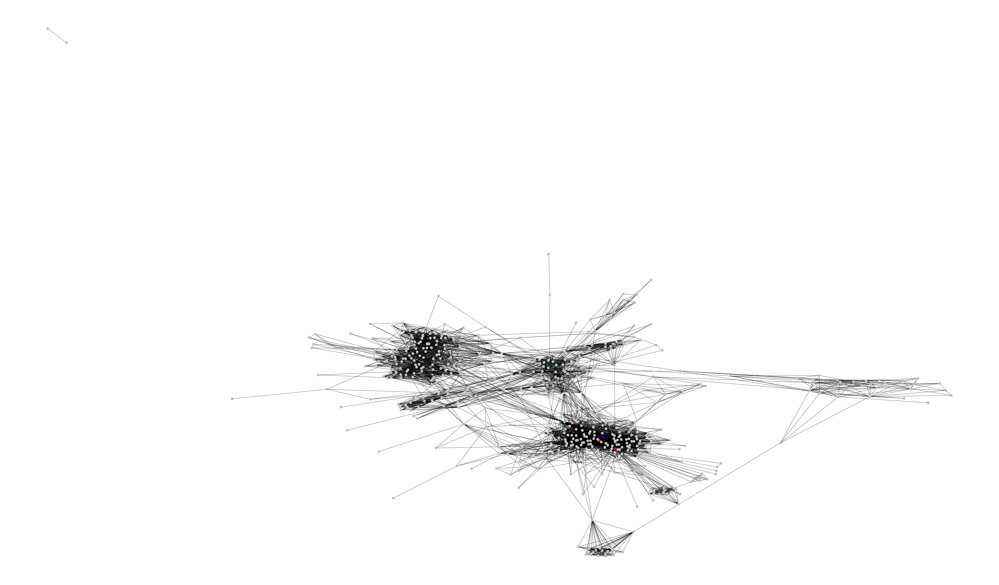

In [41]:
ego_node = '3437'
TOP_PR_NODES = ['3830', '3596', '3938']
TOP_BC_NODES = ['3830', '3604', '3918']
TOP_CC_NODES = ['3830', '3596', '3545']
TOP_DC_NODES = ['3830', '3596', '3545']
TOP_EBC_NODES = ['3830', '3566', '3918']

g3437 = sorted(G3437.nodes, key=str)

ColorLegend = {'top_pr_nodes': 'red','top_bc_nodes': 'green',
               'top_cc_nodes': 'blue', 'top_dc_nodes': 'gold','top_ebc_nodes':'violet','mixed':'orange'}
pos = nx.spring_layout(G3437)

color_map = []
for node in G3437:
    if node in TOP_PR_NODES:
        color_map.append(ColorLegend['top_pr_nodes']) 
    elif node in TOP_BC_NODES:
        color_map.append(ColorLegend['top_bc_nodes'])
    elif node in TOP_CC_NODES:
        color_map.append(ColorLegend['top_cc_nodes'])
    elif node in TOP_DC_NODES:
        color_map.append(ColorLegend['top_dc_nodes']) 
    elif node in TOP_EBC_NODES:
        color_map.append(ColorLegend['top_ebc_nodes'])    
    else:
        color_map.append(COLORS[-1])
        
plt.figure(figsize=(100,60))
nx.draw_networkx(G3437, pos=pos,node_color=color_map, with_labels=False, node_size=200)
plt.axis('off')
plt.savefig("node3437_centrality_network.png", format="PNG")
plt.show()

In [58]:
#find the 10 nodes with the highest eigenvector centrality
kc = nx.eigenvector_centrality(G3437,max_iter=5000)
sorted(kc.items(), key=lambda x: x[1], reverse=True)[:10]

[('3938', 0.19911782913144654),
 ('3596', 0.19683032186592775),
 ('3545', 0.19146028105914778),
 ('3830', 0.17661376012013463),
 ('3604', 0.1581321087435586),
 ('3633', 0.15458291256878864),
 ('3851', 0.14609177358520387),
 ('3684', 0.1385558595916239),
 ('3756', 0.13659930729683126),
 ('3611', 0.1356326982663201)]

In [42]:
# NodeID 3980 (not in here) and its ego network
G3980 = nx.Graph()
edges3980 = np.genfromtxt("facebook.tar/facebook/3980.edges", dtype=str, delimiter=' ')

for edge in edges3980:
    G3980.add_edge(edge[0], edge[1])
    
#plt.figure(figsize=(75,75))
#nx.draw(G3980, node_color='magenta')

#plt.savefig("node3980_ego_network.png", format="PNG")
#plt.show()

In [76]:
#find the 10 nodes with the highest pagerank
pr = nx.pagerank(G3980, alpha=0.85)
sorted_pr = sorted(pr.items(), key=operator.itemgetter(1),reverse=True) #sorts the page ranks of the nodes
print(sorted_pr[:10]) #find the top two nodes with highest page rank

[('4023', 0.046166077216995734), ('4030', 0.04562976472903612), ('3998', 0.03706702257991349), ('3982', 0.03345095262904082), ('4031', 0.0330959180310858), ('4014', 0.029619635477000437), ('3994', 0.02723930318967914), ('4021', 0.026366560103180316), ('4004', 0.025673957057229073), ('3997', 0.02566894647109298)]


In [77]:
#find the 10 nodes with the highest betweenness centrality
bc = nx.betweenness_centrality(G3980)
sorted(bc.items(), key=lambda x: x[1], reverse=True)[:10]

[('4023', 0.15914454858226484),
 ('4030', 0.13515358446500314),
 ('3998', 0.11492241405909226),
 ('4031', 0.10062612115553292),
 ('4014', 0.06764379232199302),
 ('4027', 0.06583759160229749),
 ('4002', 0.055340746399569936),
 ('4017', 0.050811662514084664),
 ('4038', 0.04769617579652183),
 ('4020', 0.04386567309404679)]

In [78]:
#find the 10 nodes with the highest closeness centrality
cc = nx.closeness_centrality(G3980) 
sorted(cc.items(), key=lambda x: x[1], reverse=True)[:10]

[('4023', 0.47703818369453044),
 ('4030', 0.45892280963018117),
 ('4014', 0.43160597572362275),
 ('3998', 0.43160597572362275),
 ('3982', 0.4215686274509804),
 ('4004', 0.40735844899757656),
 ('4020', 0.40735844899757656),
 ('3994', 0.4028322440087146),
 ('3997', 0.39840551605257485),
 ('4038', 0.394075021312873)]

In [79]:
#find the 10 nodes with the highest degree centrality
dc = nx.degree_centrality(G3980)
sorted(dc.items(), key=lambda x: x[1], reverse=True)[:10]

[('4030', 0.3529411764705882),
 ('4023', 0.3333333333333333),
 ('3998', 0.2549019607843137),
 ('3982', 0.2549019607843137),
 ('4014', 0.21568627450980393),
 ('3997', 0.19607843137254902),
 ('4031', 0.19607843137254902),
 ('4021', 0.19607843137254902),
 ('3994', 0.19607843137254902),
 ('4004', 0.1764705882352941)]

In [80]:
#find the 10 edges with the highest betweenness centrality
ebc = nx.edge_betweenness_centrality(G3980)
sorted(ebc.items(), key=lambda x: x[1], reverse=True)[:10]

[(('3998', '3999'), 0.06184012066365008),
 (('4023', '4031'), 0.055493798140856955),
 (('4030', '4020'), 0.04304142165467691),
 (('3994', '3996'), 0.038346130993189814),
 (('3998', '4002'), 0.03636562239503415),
 (('4038', '4014'), 0.03459256550486255),
 (('4030', '4017'), 0.033442537854302554),
 (('4032', '4027'), 0.032428355957767725),
 (('4027', '4006'), 0.032428355957767725),
 (('4023', '4034'), 0.032428355957767725)]

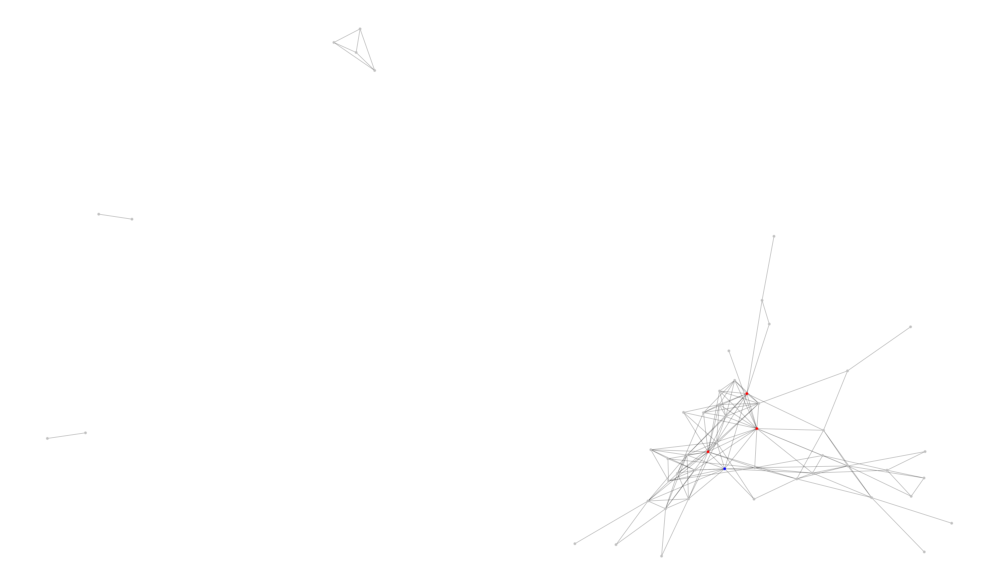

In [43]:
ego_node = '3980'
TOP_PR_NODES = ['4023', '4030', '3998']
TOP_BC_NODES = ['4023', '4030', '3998']
TOP_CC_NODES = ['4023', '4030', '4014']
TOP_DC_NODES = ['4023', '4030', '3998']
TOP_EBC_NODES = ['3998', '4023', '4030']

g3980 = sorted(G3980.nodes, key=str)

ColorLegend = {'top_pr_nodes': 'red','top_bc_nodes': 'green',
               'top_cc_nodes': 'blue', 'top_dc_nodes': 'gold','top_ebc_nodes':'violet','mixed':'orange'}
pos = nx.spring_layout(G3980)

# f = plt.figure(1)
# ax = f.add_subplot(1,1,1)
# for label in ColorLegend:
#     ax.plot([0],[0], color=ColorLegend[label], label=label)

color_map = []
for node in G3980:
    if node in TOP_PR_NODES:
        color_map.append(ColorLegend['top_pr_nodes']) 
    elif node in TOP_BC_NODES:
        color_map.append(ColorLegend['top_bc_nodes'])
    elif node in TOP_CC_NODES:
        color_map.append(ColorLegend['top_cc_nodes'])
    elif node in TOP_DC_NODES:
        color_map.append(ColorLegend['top_dc_nodes']) 
    elif node in TOP_EBC_NODES:
        color_map.append(ColorLegend['top_ebc_nodes'])    
    else:
        color_map.append(COLORS[-1])
        
plt.figure(figsize=(100,60))
nx.draw_networkx(G3980, pos=pos,node_color=color_map, with_labels=False, node_size=200)
plt.axis('off')
plt.savefig("node3980_centrality_network.png", format="PNG")
plt.show()